# 2023C2: Processing SST1 RSoXS Data

In [6]:
# # Only needs to be run once per session, restart kernel after running

# %pip install pyhyperscattering==0.2.1  # to use pip published package
!pip install -e /nsls2/users/alevin/repos/PyHyperScattering  # to use pip to install via directory
!pip install --pre --upgrade tiled[all] databroker  # bottleneck # needed to fix tiled/databroker error in SST1RSoXSDB

Obtaining file:///nsls2/users/alevin/repos/PyHyperScattering
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for PyHyperScattering (pyproject.toml) ... done
  Created wheel for PyHyperScattering: filename=PyHyperScattering-0.2.1+37.gac1f562-0.editable-py3-none-any.whl size=5355 sha256=4c439347804ba2ae487b34398ef8ca700e78d99360b5f9b97d1dc96316986985
  Stored in directory: /tmp/pip-ephem-wheel-cache-21x18sdm/wheels/7d/89/c7/db1d0cb1cf714f3a03a438abee7b78ce09921efd15259b1f5f
Successfully built PyHyperScattering
  Attempting uninstall: PyHyperScattering
    Found existing installation: PyHyperScattering 0.2.1+37.gac1f562
    Uninstalling PyHyperScattering-0.2.1+37.gac1f562:
      Successfully uninstalled PyHyperScattering-0.2.1+37.gac1f562
  Using cached tiled-0.1.0a106-py3-none-any.whl (1.5 MB)
  Using cached da

## Imports

In [ ]:
%load_ext autoreload

In [ ]:
%autoreload 2

In [1]:
# Imports
import PyHyperScattering as phs
import pathlib
import sys
import ast
import json
import datetime
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from tqdm.auto import tqdm
import dask.array as da
from tiled.client import from_profile, from_uri

sys.path.append('/nsls2/users/alevin/local_lib')
from andrew_rsoxs_fxns import *

print(f'Using PyHyperScattering Version: {phs.__version__}')

/nsls2/users/alevin/repos/PyHyperScattering/src/PyHyperScattering/integrate.py:3: UserWarning: Could not import CuPy or ndigpu.  If you expect this machine to support CuPy, check dependencies.  Falling back to scikit-image/numpy CPU integration.
  from PyHyperScattering.WPIntegrator import WPIntegrator


Using PyHyperScattering Version: 0.2.1+37.gac1f562


In [2]:
sample_guide['andrew18'] = 'PM7D5-Y12-CF_2'
sample_guide['andrew20'] = 'PM7D5-Y12-Tol_2'
sample_guide

{'andrew1': 'PM6-Y6-CF',
 'andrew2': 'PM6-Y6-CFCN',
 'andrew3': 'PM6-Y6-Tol',
 'andrew4': 'PM6-Y7-CF',
 'andrew5': 'PM6-Y7-CFCN',
 'andrew6': 'PM6-Y7-Tol',
 'andrew7': 'PM6-Y7BO-CF',
 'andrew8': 'PM6-Y7BO-CFCN',
 'andrew9': 'PM6-Y7BO-Tol',
 'andrew10': 'PM6-Y12-CF',
 'andrew11': 'PM6-Y12-CFCN',
 'andrew12': 'PM6-Y12-Tol',
 'andrew13': 'PM7D5-Y6-CF',
 'andrew14': 'PM7D5-Y6-Tol',
 'andrew15': 'PM7D5-Y247-CF',
 'andrew16': 'PM7D5-Y247-Tol',
 'andrew17': 'PM7D5-Y12-CF',
 'andrew18': 'PM7D5-Y12-CF_2',
 'andrew19': 'PM7D5-Y12-Tol',
 'andrew20': 'PM7D5-Y12-Tol_2'}

## Define paths & short functions

In [3]:
# Define directory paths
userPath = pathlib.Path('/nsls2/users/alevin')
# propPath = pathlib.Path('/nsls2/data/sst/proposals/2023-2/pass-311130')
# outPath = propPath.joinpath('processed_data')
# jsonPath = outPath.joinpath('local_config')
# maskPath = outPath.joinpath('masks')
# zarrsPath = outPath.joinpath('zarrs')
# calibPath = propPath.joinpath('Calibration')
# samplePath = propPath.joinpath('TRMSN_NEXAFS_and_RSoXS')
# # samplePath = pathlib.Path('/nsls2/data/sst/proposals/2022-2/pass-309180/raw_data/rsoxs/2022-08-01')
# # samplePath = pathlib.Path('/nsls2/data/sst/legacy/RSoXS/suitcased_data/users/2021-3/GU-309180-CUBLDER/auto/RSoXS/2021-11-19')


propPath = pathlib.Path('/nsls2/data/sst/proposals/2022-2/pass-309180')
outPath = propPath.joinpath('processed_data')
zarrsPath = outPath.joinpath('zarrs')


In [4]:
# Some user defined functions for loading metadata
def load_monitors(loader, run, dims=['energy', 'polarization']):
    md = loader.loadMd(run)
    monitors = loader.loadMonitors(run)
    dims_to_join = []
    dim_names_to_join = []
    for dim in dims:
        dims_to_join.append(md[dim].compute())
        dim_names_to_join.append(dim)  
    index = pd.MultiIndex.from_arrays(dims_to_join, names=dim_names_to_join)
    monitors_remeshed = monitors.rename({'time':'system'}).reset_index('system').assign_coords(system=index).unstack('system')
    return monitors_remeshed

def load_diode(loader, run):
    monitors = loader.loadMonitors(run)
    energies = monitors['en_monoen_readback']
    monitors = monitors.rename({'time':'energy'}).reset_index('energy').assign_coords(energy=energies.data)
    polarization = float(round(run['baseline']['data']['en_polarization'][0].compute()))
    monitors = monitors.expand_dims({'polarization': [polarization]})
    # monitors.attrs['diode_scan_id'] = run.start['scan_id']
    monitors = monitors.dropna(dim='energy').groupby('energy').mean()
    
    return monitors

## Load from local file

In [ ]:
local_loader = phs.load.SST1RSoXSLoader(corr_mode='none')

In [ ]:
scan_id = '65802'
# scan_id = '34427'
filepath = samplePath.joinpath(scan_id)
filepath

In [ ]:
[f.name for f in filepath.iterdir()]

In [ ]:
# local_loader = SST1RSoXSLoader(corr_mode='None')
da = local_loader.loadFileSeries(filepath, dims=['energy', 'polarization'])
da

In [ ]:
da = da.unstack('system')
# da = da.where(da>1e-3)
da

In [ ]:
# cmin = float(da.quantile(0.1))
# cmax = float(da.quantile(0.9))

# da.sel(polarization=0, energy=285, method='nearest').plot.imshow(norm=LogNorm(1e1, 1e4), cmap=cmap, interpolation='nearest')

energies = [270, 280, 282, 283, 284, 285, 286, 290]

fg = da.sel(polarization=90, method='nearest').sel(energy=energies, method='nearest').plot.imshow(figsize=(18, 6),
                col='energy', col_wrap=4, norm=LogNorm(1, 1e4), cmap=cmap, interpolation='nearest')
fg.cbar.set_label('Intensity [arb. units]', rotation=270, labelpad=15)
for axes in fg.axs.flatten():
    axes.set(aspect='equal')

plt.show()

## Load raw data from databroker & save zarrs

In [5]:
# Define catalog(s):
c = from_profile("rsoxs", structure_clients='dask')
# c = from_uri('https://tiled.nsls2.bnl.gov/', structure_clients='numpy')['rsoxs']['raw']
print(c)

OBJECT CACHE: Will use up to 121_499_065_958 bytes (15% of total physical RAM)
INFO:tiled.server.object_cache:Will use up to 121_499_065_958 bytes (15% of total physical RAM)


<Catalog {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, ...} ~68868 entries>


In [6]:
# Define loader(s):
# db_loader = phs.load.SST1RSoXSDB(corr_mode='None', catalog=c, catalog_kwargs={}, dark_pedestal=40)  # initialize rsoxs databroker loader w/ Dask
db_loader = phs.load.SST1RSoXSDB(corr_mode='none', use_chunked_loading=True, dark_pedestal=40)  # initialize rsoxs databroker loader w/ Dask

OBJECT CACHE: Will use up to 121_499_065_958 bytes (15% of total physical RAM)
INFO:tiled.server.object_cache:Will use up to 121_499_065_958 bytes (15% of total physical RAM)


In [7]:
## Search for and summarize runs:
# runs_sum_df = db_loader.summarize_run(institution='CUBLDER', cycle='2023-2', project='Cal', sample_id='diode', plan='oxygen')
# runs_sum_df = db_loader.summarize_run(institution='CUBLDER', cycle='2023-2', sample_id='', project='TRMSN', plan='rsoxs_carbon')
runs_sum_df = db_loader.summarize_run(institution='CUBLDER',cycle='2022-2', sample='andrew*', plan='full*', debugWarnings=False)
# runs_sum_df = db_loader.summarize_run(institution='CUBLDER',cycle='2021-3', sample='', plan='full*')

# runs_sum_df = runs_sum_df.set_index('scan_id')  # optional, set index to scan id
print(runs_sum_df['plan'].unique())
display(runs_sum_df)

Running catalog search...:   0%|          | 0/9 [00:00<?, ?it/s]

Retrieving results...:   0%|          | 0/90 [00:00<?, ?it/s]

/tmp/ipykernel_91286/2239470507.py:4: UserWarning: One or more missing field(s) during this load were replaced with "N/A".  Re-run with debugWarnings=True to see details.
  runs_sum_df = db_loader.summarize_run(institution='CUBLDER',cycle='2022-2', sample='andrew*', plan='full*', debugWarnings=False)


['full_carbon_scan_nd']


,scan_id,start_time,cycle,institution,project,sample_name,sample_id,plan,detector,lab_pol,exit_status,num_Images
0,43140,2022-07-31 16:58:29.368251,2022-2,CUBLDER,rsoxs,andrew3,andrew3,full_carbon_scan_nd,SAXS,"[0, 0]",success,128
1,43141,2022-07-31 17:12:19.566092,2022-2,CUBLDER,rsoxs,andrew3,andrew3,full_carbon_scan_nd,SAXS,"[90, 90]",success,128
2,43142,2022-07-31 17:25:19.278039,2022-2,CUBLDER,rsoxs,andrew2,andrew2,full_carbon_scan_nd,SAXS,"[0, 0]",success,128
3,43143,2022-07-31 17:38:39.877708,2022-2,CUBLDER,rsoxs,andrew2,andrew2,full_carbon_scan_nd,SAXS,"[90, 90]",success,128
4,43144,2022-07-31 17:51:35.955810,2022-2,CUBLDER,rsoxs,andrew1,andrew1,full_carbon_scan_nd,SAXS,"[0, 0]",success,128
...,...,...,...,...,...,...,...,...,...,...,...,...
85,43234,2022-08-01 18:50:36.412093,2022-2,CUBLDER,rsoxs,andrew18,andrew18,full_carbon_scan_nd,WAXS,"[90, 90]",success,128
86,43235,2022-08-01 19:03:45.222485,2022-2,CUBLDER,rsoxs,andrew17,andrew17,full_carbon_scan_nd,WAXS,"[0, 0]",success,128
87,43236,2022-08-01 19:16:52.129164,2022-2,CUBLDER,rsoxs,andrew17,andrew17,full_carbon_scan_nd,WAXS,"[90, 90]",success,128
88,43237,2022-08-01 19:30:20.075900,2022-2,CUBLDER,rsoxs,andrew4,andrew4,full_carbon_scan_nd,WAXS,"[0, 0]",success,128


In [64]:
## Search for and summarize runs:
runs_sum_df = db_loader.summarize_run(institution='CUBLDER', cycle='2022-2', project='Cal', sample_id='diode', plan='')
# runs_sum_df = db_loader.summarize_run(institution='CUBLDER', cycle='2023-2', sample_id='', project='TRMSN', plan='rsoxs_carbon')
# runs_sum_df = db_loader.summarize_run(institution='CUBLDER',cycle='2022-2', sample='andrew*', plan='full*', debugWarnings=False)
# runs_sum_df = db_loader.summarize_run(institution='CUBLDER',cycle='2021-3', sample='', plan='full*')

# runs_sum_df = runs_sum_df.set_index('scan_id')  # optional, set index to scan id
print(runs_sum_df['plan'].unique())
display(runs_sum_df)

Running catalog search...:   0%|          | 0/10 [00:00<?, ?it/s]

Retrieving results...:   0%|          | 0/17 [00:00<?, ?it/s]

/tmp/ipykernel_64124/3886289111.py:2: UserWarning: One or more missing field(s) during this load were replaced with "N/A".  Re-run with debugWarnings=True to see details.
  runs_sum_df = db_loader.summarize_run(institution='CUBLDER', cycle='2022-2', project='Cal', sample_id='diode', plan='')


['fly_Carbon_NEXAFS' 'full_carbon_scan_nd']


,scan_id,start_time,cycle,institution,project,sample_name,sample_id,plan,detector,lab_pol,exit_status,num_Images,sample_id
0,43135,2022-07-31 16:22:09.776060,2022-2,CUBLDER,calibration,diode,diode,fly_Carbon_NEXAFS,SAXS,N/A,success,501,diode
1,43136,2022-07-31 16:24:55.486868,2022-2,CUBLDER,calibration,diode,diode,fly_Carbon_NEXAFS,SAXS,N/A,success,432,diode
2,43137,2022-07-31 16:27:35.038072,2022-2,CUBLDER,calibration,diode,diode,fly_Carbon_NEXAFS,SAXS,N/A,success,471,diode
3,43138,2022-07-31 16:30:14.495970,2022-2,CUBLDER,calibration,diode,diode,fly_Carbon_NEXAFS,SAXS,N/A,success,548,diode
4,43139,2022-07-31 16:32:58.022661,2022-2,CUBLDER,calibration,diode,diode,fly_Carbon_NEXAFS,SAXS,N/A,success,590,diode
5,43183,2022-08-01 05:48:14.178563,2022-2,CUBLDER,calibration,diode,diode,full_carbon_scan_nd,SAXS,"[0, 0]",fail,92,diode
6,43184,2022-08-01 07:47:00.221422,2022-2,CUBLDER,calibration,diode,diode,full_carbon_scan_nd,SAXS,"[0, 0]",abort,1,diode
7,43185,2022-08-01 07:49:41.229109,2022-2,CUBLDER,calibration,diode,diode,full_carbon_scan_nd,SAXS,"[0, 0]",success,128,diode
8,43186,2022-08-01 08:02:20.059173,2022-2,CUBLDER,calibration,diode,diode,full_carbon_scan_nd,SAXS,"[90, 90]",success,128,diode
9,43327,2022-08-02 00:05:11.316620,2022-2,CUBLDER,calibration,diode,diode,fly_Carbon_NEXAFS,WAXS,N/A,success,635,diode


In [118]:
c[43331]['baseline']['data']['en_polarization_setpoint'][0].compute()

90.0

In [10]:
with pd.option_context('display.max_rows', None):
    display(runs_sum_df)

,scan_id,start_time,cycle,institution,project,sample_name,sample_id,plan,detector,lab_pol,exit_status,num_Images
0,43140,2022-07-31 16:58:29.368251,2022-2,CUBLDER,rsoxs,andrew3,andrew3,full_carbon_scan_nd,SAXS,"[0, 0]",success,128
1,43141,2022-07-31 17:12:19.566092,2022-2,CUBLDER,rsoxs,andrew3,andrew3,full_carbon_scan_nd,SAXS,"[90, 90]",success,128
2,43142,2022-07-31 17:25:19.278039,2022-2,CUBLDER,rsoxs,andrew2,andrew2,full_carbon_scan_nd,SAXS,"[0, 0]",success,128
3,43143,2022-07-31 17:38:39.877708,2022-2,CUBLDER,rsoxs,andrew2,andrew2,full_carbon_scan_nd,SAXS,"[90, 90]",success,128
4,43144,2022-07-31 17:51:35.955810,2022-2,CUBLDER,rsoxs,andrew1,andrew1,full_carbon_scan_nd,SAXS,"[0, 0]",success,128
5,43145,2022-07-31 18:04:53.701960,2022-2,CUBLDER,rsoxs,andrew1,andrew1,full_carbon_scan_nd,SAXS,"[90, 90]",success,128
6,43146,2022-07-31 18:18:08.486346,2022-2,CUBLDER,rsoxs,andrew8,andrew8,full_carbon_scan_nd,SAXS,"[0, 0]",success,128
7,43147,2022-07-31 18:31:20.878430,2022-2,CUBLDER,rsoxs,andrew8,andrew8,full_carbon_scan_nd,SAXS,"[90, 90]",success,70
8,43148,2022-07-31 19:19:33.820579,2022-2,CUBLDER,rsoxs,andrew8,andrew8,full_carbon_scan_nd,SAXS,"[90, 90]",success,128
9,43149,2022-07-31 19:32:43.778932,2022-2,CUBLDER,rsoxs,andrew7,andrew7,full_carbon_scan_nd,SAXS,"[0, 0]",success,128


In [8]:
## Slice output dataframe for samples of interest
# plan_of_interest = 'rsoxs_carbon'
plan_of_interest = 'full_carbon_scan_nd'

df = runs_sum_df
# runs_of_interest = df
runs_of_interest = df[(df['plan']==plan_of_interest) & 
                      (df['num_Images']==128) & 
                      (df['detector']=='SAXS')]
# runs_of_interest = df[(df['plan']==plan_of_interest) & (df['num_Images']==228)]
# runs_of_interest = df[(df['plan']==plan_of_interest) & (df['num_Images']==114)]
# runs_of_interest = df[(df['plan']==plan_of_interest) & (df['num_Images']==80)]

display(runs_of_interest)

,scan_id,start_time,cycle,institution,project,sample_name,sample_id,plan,detector,lab_pol,exit_status,num_Images
0,43140,2022-07-31 16:58:29.368251,2022-2,CUBLDER,rsoxs,andrew3,andrew3,full_carbon_scan_nd,SAXS,"[0, 0]",success,128
1,43141,2022-07-31 17:12:19.566092,2022-2,CUBLDER,rsoxs,andrew3,andrew3,full_carbon_scan_nd,SAXS,"[90, 90]",success,128
2,43142,2022-07-31 17:25:19.278039,2022-2,CUBLDER,rsoxs,andrew2,andrew2,full_carbon_scan_nd,SAXS,"[0, 0]",success,128
3,43143,2022-07-31 17:38:39.877708,2022-2,CUBLDER,rsoxs,andrew2,andrew2,full_carbon_scan_nd,SAXS,"[90, 90]",success,128
4,43144,2022-07-31 17:51:35.955810,2022-2,CUBLDER,rsoxs,andrew1,andrew1,full_carbon_scan_nd,SAXS,"[0, 0]",success,128
5,43145,2022-07-31 18:04:53.701960,2022-2,CUBLDER,rsoxs,andrew1,andrew1,full_carbon_scan_nd,SAXS,"[90, 90]",success,128
6,43146,2022-07-31 18:18:08.486346,2022-2,CUBLDER,rsoxs,andrew8,andrew8,full_carbon_scan_nd,SAXS,"[0, 0]",success,128
8,43148,2022-07-31 19:19:33.820579,2022-2,CUBLDER,rsoxs,andrew8,andrew8,full_carbon_scan_nd,SAXS,"[90, 90]",success,128
9,43149,2022-07-31 19:32:43.778932,2022-2,CUBLDER,rsoxs,andrew7,andrew7,full_carbon_scan_nd,SAXS,"[0, 0]",success,128
10,43150,2022-07-31 19:45:36.817206,2022-2,CUBLDER,rsoxs,andrew7,andrew7,full_carbon_scan_nd,SAXS,"[90, 90]",success,128


In [ ]:
## Cell to check polarizations of nexafs scans

# scan_id = 65760 # nexafs nitrogen
# # scan_id = 65840  # rsoxs nitrogen
# lab_pol = round(c[scan_id]['baseline']['data']['en_polarization'][0].compute())
# sample_pol = round(c[scan_id]['baseline']['data']['en_sample_polarization'][0].compute())
# print(f'Lab: {lab_pol}, Sample: {sample_pol}')

In [9]:
raw_int_DA_rows = []
samp_au_DA_rows = []
for scan_id in tqdm(runs_of_interest['scan_id'][::2]):
    raw_int_DA = load_stacked_pol(db_loader, scan_id, scan_id+1)
    raw_int_DA = raw_int_DA.rename({'pol':'polarization'})
    sample_id = raw_int_DA.start['sample_id']
    sample_name = raw_int_DA.sample_name
    
    raw_int_DA = raw_int_DA.expand_dims({'scan_id': [raw_int_DA.sampleid]})
    raw_int_DA = raw_int_DA.assign_coords(sample_id=('scan_id', [sample_id]),
                          sample_name=('scan_id', [sample_name]))
    raw_int_DA_rows.append(raw_int_DA)
    
    monitors1 = load_monitors(db_loader, c[scan_id], dims=['energy', 'polarization'])
    monitors2 = load_monitors(db_loader, c[scan_id+1], dims=['energy', 'polarization'])
    monitors = xr.concat([monitors1, monitors2], dim='polarization')
    samp_au_DA = monitors['RSoXS Au Mesh Current']
    samp_au_DA = samp_au_DA.expand_dims({'scan_id': [raw_int_DA.sampleid]})
    samp_au_DA = samp_au_DA.assign_coords(sample_id=('scan_id', [sample_id]),
                                sample_name=('scan_id', [sample_name]))
    samp_au_DA_rows.append(samp_au_DA)

DS = xr.concat(raw_int_DA_rows, 'scan_id').to_dataset(name='raw_intensity')
DS['sample_au_mesh'] = xr.concat(samp_au_DA_rows, 'scan_id')

detector = DS['raw_intensity'].rsoxs_config
DS.attrs['name'] = f'{plan_of_interest}-{detector}'

DS = DS.swap_dims({'scan_id':'sample_name'})

  0%|          | 0/20 [00:00<?, ?it/s]

/nsls2/users/alevin/repos/PyHyperScattering/src/PyHyperScattering/SST1RSoXSDB.py:542: UserWarning: While loading RSoXS Sample Up-Down to infill metadata entry for sam_y, found beginning and end values unequal: <DaskArrayClient shape=(2,) chunks=((2,),) dtype=float64 dims=('time',)>.  It is possible something is messed up.
  md = self.loadMd(run)
/tmp/ipykernel_91286/1639490141.py:3: UserWarning: While loading RSoXS Sample Up-Down to infill metadata entry for sam_y, found beginning and end values unequal: <DaskArrayClient shape=(2,) chunks=((2,),) dtype=float64 dims=('time',)>.  It is possible something is messed up.
  md = loader.loadMd(run)
/nsls2/users/alevin/repos/PyHyperScattering/src/PyHyperScattering/SST1RSoXSDB.py:542: UserWarning: While loading RSoXS Sample Up-Down to infill metadata entry for sam_y, found beginning and end values unequal: <DaskArrayClient shape=(2,) chunks=((2,),) dtype=float64 dims=('time',)>.  It is possible something is messed up.
  md = self.loadMd(run)
/n

In [10]:
DS

<xarray.Dataset>
Dimensions:         (sample_name: 20, energy: 128, polarization: 2,
                     pix_x: 1026, pix_y: 1024)
Coordinates:
    scan_id         (sample_name) int64 43140 43142 43144 ... 43177 43179 43181
  * energy          (energy) float64 270.0 270.5 271.0 ... 335.0 340.0 345.0
    dark_id         (sample_name, polarization, energy) float64 0.0 0.0 ... 2.0
  * pix_x           (pix_x) int64 0 1 2 3 4 5 ... 1020 1021 1022 1023 1024 1025
  * pix_y           (pix_y) int64 0 1 2 3 4 5 ... 1018 1019 1020 1021 1022 1023
  * polarization    (polarization) float64 0.0 90.0
    sample_id       (sample_name) <U8 'andrew3' 'andrew2' ... 'andrew4'
  * sample_name     (sample_name) <U8 'andrew3' 'andrew2' ... 'andrew4'
Data variables:
    raw_intensity   (sample_name, polarization, pix_y, pix_x, energy) float64 dask.array<chunksize=(1, 1, 1024, 1026, 1), meta=np.ndarray>
    sample_au_mesh  (sample_name, energy, polarization) float64 dask.array<chunksize=(1, 1, 1), meta=np.ndarray>
Attributes:
    name:     full_carbon_scan_nd-saxs

In [11]:
# previously determined to be correct using later cells, don't apply q_labels if not
bcxy_2023C2 = {'waxs_bcx': 446.4, 'waxs_bcy': 505.5}  
bcxy_2022C2 = {'waxs_bcx': 396.3, 'waxs_bcy': 553, 'saxs_bcx': 488, 'saxs_bcy': 515}  
bcxy_2021C3 = {'waxs_bcx': 394, 'waxs_bcy': 537}  

bcxy = bcxy_2022C2

# DS['raw_intensity'].attrs['beamcenter_x'] = bcxy['waxs_bcx']
# DS['raw_intensity'].attrs['beamcenter_y'] = bcxy['waxs_bcy']
DS['raw_intensity'].attrs['beamcenter_x'] = bcxy['saxs_bcx']
DS['raw_intensity'].attrs['beamcenter_y'] = bcxy['saxs_bcy']

DS['raw_intensity'] = apply_q_labels(DS['raw_intensity'])

DS

<xarray.Dataset>
Dimensions:         (sample_name: 20, energy: 128, polarization: 2,
                     pix_x: 1026, pix_y: 1024)
Coordinates:
    scan_id         (sample_name) int64 43140 43142 43144 ... 43177 43179 43181
  * energy          (energy) float64 270.0 270.5 271.0 ... 335.0 340.0 345.0
    dark_id         (sample_name, polarization, energy) float64 0.0 0.0 ... 2.0
  * pix_x           (pix_x) int64 0 1 2 3 4 5 ... 1020 1021 1022 1023 1024 1025
  * pix_y           (pix_y) int64 0 1 2 3 4 5 ... 1018 1019 1020 1021 1022 1023
  * polarization    (polarization) float64 0.0 90.0
    sample_id       (sample_name) <U8 'andrew3' 'andrew2' ... 'andrew4'
  * sample_name     (sample_name) <U8 'andrew3' 'andrew2' ... 'andrew4'
    qx              (pix_x, energy) float64 -0.008193 -0.008208 ... 0.01152
    qy              (pix_y, energy) float64 -0.008646 -0.008662 ... 0.0109
Data variables:
    raw_intensity   (sample_name, polarization, pix_y, pix_x, energy) float64 dask.array<chunksize=(1, 1, 1024, 1026, 1), meta=np.ndarray>
    sample_au_mesh  (sample_name, energy, polarization) float64 dask.array<chunksize=(1, 1, 1), meta=np.ndarray>
Attributes:
    name:     full_carbon_scan_nd-saxs

In [121]:
def load_diode(loader, run):
    monitors = loader.loadMonitors(run)
    energies = monitors['en_monoen_readback']
    monitors = monitors.rename({'time':'energy'}).reset_index('energy').assign_coords(energy=energies.data)
    polarization = float(round(run['baseline']['data']['en_polarization'][0].compute()))
    monitors = monitors.expand_dims({'polarization': [polarization]})
    # monitors.attrs['diode_scan_id'] = run.start['scan_id']
    monitors = monitors.dropna(dim='energy').groupby('energy').mean()
    
    return monitors

In [12]:
# 2022C2
# carbon_diodes = {0: 43185, 90: 43186}
carbon_diodes = {0: 43327, 90: 43331}

# 2023C2
# carbon_diodes = {0: 65793, 90: 65794}
# nitrogen_diodes = {0: 65696, 90: 65700}
# oxygen_diodes = {0: 65756, 90: 65760}

diode_monitors_00pol = load_diode(db_loader, c[carbon_diodes[0]])
diode_monitors_90pol = load_diode(db_loader, c[carbon_diodes[90]])

In [13]:
coords = {'energy':DS['energy'].data}
diode_monitors_00pol = diode_monitors_00pol.interp(coords)
diode_monitors_90pol = diode_monitors_90pol.interp(coords)

In [14]:
diode_monitors = xr.concat([diode_monitors_00pol, diode_monitors_90pol], dim='polarization')
diode_monitors

<xarray.Dataset>
Dimensions:                         (polarization: 2, energy: 128)
Coordinates:
  * polarization                    (polarization) float64 0.0 90.0
  * energy                          (energy) float64 270.0 270.5 ... 340.0 345.0
Data variables:
    NSLS-II Ring Current            (energy, polarization) float64 dask.array<chunksize=(128, 1), meta=np.ndarray>
    RSoXS Au Mesh Current           (energy, polarization) float64 dask.array<chunksize=(128, 1), meta=np.ndarray>
    RSoXS Sample Current            (energy, polarization) float64 dask.array<chunksize=(128, 1), meta=np.ndarray>
    RSoXS Shutter Toggle            (energy, polarization) float64 dask.array<chunksize=(128, 1), meta=np.ndarray>
    RSoXS Slit 1 Bottom Current     (energy, polarization) float64 dask.array<chunksize=(128, 1), meta=np.ndarray>
    RSoXS Slit 1 In Board Current   (energy, polarization) float64 dask.array<chunksize=(128, 1), meta=np.ndarray>
    RSoXS Slit 1 Out Board Current  (energy, polarization) float64 dask.array<chunksize=(128, 1), meta=np.ndarray>
    RSoXS Slit 1 Top Current        (energy, polarization) float64 dask.array<chunksize=(128, 1), meta=np.ndarray>
    SAXS Beamstop                   (energy, polarization) float64 dask.array<chunksize=(128, 1), meta=np.ndarray>
    WAXS Beamstop                   (energy, polarization) float64 dask.array<chunksize=(128, 1), meta=np.ndarray>
    en_monoen_readback              (energy, polarization) float64 dask.array<chunksize=(128, 1), meta=np.ndarray>
    RSoXS Shutter Toggle_thinned    (energy, polarization) float64 1.0 ... nan
Attributes:
    stream_name:  NSLS-II Ring Current_monitor

In [15]:
DS['calib_au_mesh'] = diode_monitors['RSoXS Au Mesh Current']
DS['calib_diode'] = diode_monitors['WAXS Beamstop']
DS

<xarray.Dataset>
Dimensions:         (sample_name: 20, energy: 128, polarization: 2,
                     pix_x: 1026, pix_y: 1024)
Coordinates:
    scan_id         (sample_name) int64 43140 43142 43144 ... 43177 43179 43181
  * energy          (energy) float64 270.0 270.5 271.0 ... 335.0 340.0 345.0
    dark_id         (sample_name, polarization, energy) float64 0.0 0.0 ... 2.0
  * pix_x           (pix_x) int64 0 1 2 3 4 5 ... 1020 1021 1022 1023 1024 1025
  * pix_y           (pix_y) int64 0 1 2 3 4 5 ... 1018 1019 1020 1021 1022 1023
  * polarization    (polarization) float64 0.0 90.0
    sample_id       (sample_name) <U8 'andrew3' 'andrew2' ... 'andrew4'
  * sample_name     (sample_name) <U8 'andrew3' 'andrew2' ... 'andrew4'
    qx              (pix_x, energy) float64 -0.008193 -0.008208 ... 0.01152
    qy              (pix_y, energy) float64 -0.008646 -0.008662 ... 0.0109
Data variables:
    raw_intensity   (sample_name, polarization, pix_y, pix_x, energy) float64 dask.array<chunksize=(1, 1, 1024, 1026, 1), meta=np.ndarray>
    sample_au_mesh  (sample_name, energy, polarization) float64 dask.array<chunksize=(1, 1, 1), meta=np.ndarray>
    calib_au_mesh   (energy, polarization) float64 dask.array<chunksize=(128, 1), meta=np.ndarray>
    calib_diode     (energy, polarization) float64 dask.array<chunksize=(128, 1), meta=np.ndarray>
Attributes:
    name:     full_carbon_scan_nd-saxs

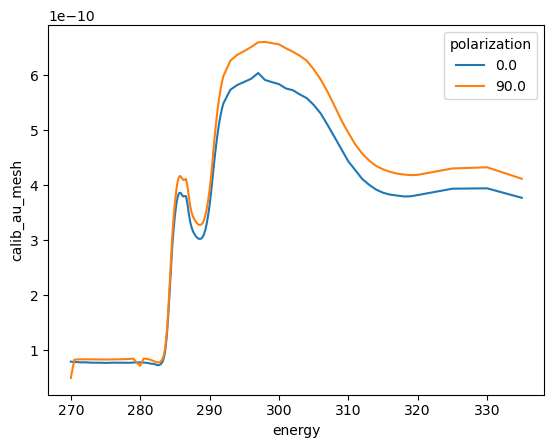

In [16]:
DS['calib_au_mesh'].plot(hue='polarization')

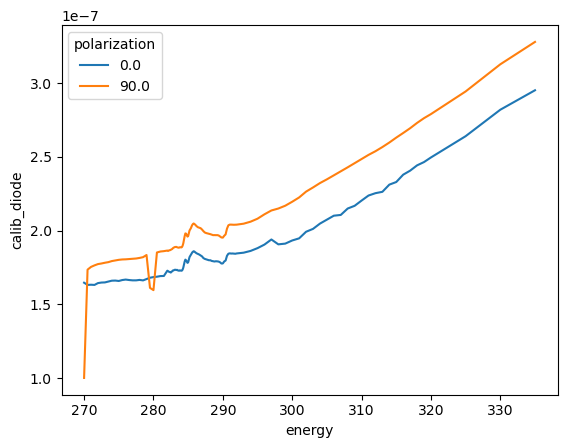

In [17]:
DS['calib_diode'].plot(hue='polarization')

In [18]:
double_norm_DA = ((1 / DS['sample_au_mesh'])
                        * (DS['calib_au_mesh'] / DS['calib_diode']))

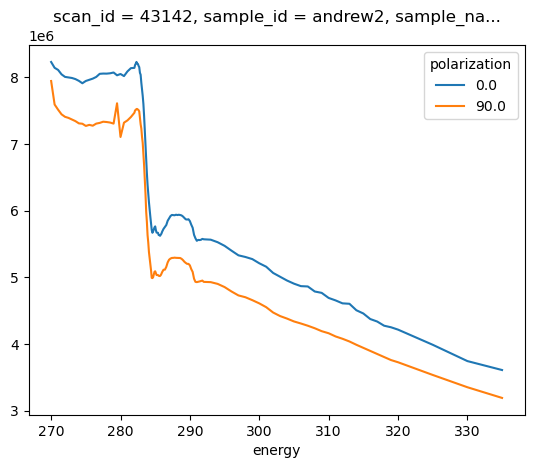

In [19]:
double_norm_DA.sel(sample_name='andrew2').plot(hue='polarization')

In [20]:
DS['corr_intensity'] = ((DS['raw_intensity'] / DS['sample_au_mesh'])
                        * (DS['calib_au_mesh'] / DS['calib_diode']))

DS

<xarray.Dataset>
Dimensions:         (sample_name: 20, energy: 128, polarization: 2,
                     pix_x: 1026, pix_y: 1024)
Coordinates:
    scan_id         (sample_name) int64 43140 43142 43144 ... 43177 43179 43181
  * energy          (energy) float64 270.0 270.5 271.0 ... 335.0 340.0 345.0
    dark_id         (sample_name, polarization, energy) float64 0.0 0.0 ... 2.0
  * pix_x           (pix_x) int64 0 1 2 3 4 5 ... 1020 1021 1022 1023 1024 1025
  * pix_y           (pix_y) int64 0 1 2 3 4 5 ... 1018 1019 1020 1021 1022 1023
  * polarization    (polarization) float64 0.0 90.0
    sample_id       (sample_name) <U8 'andrew3' 'andrew2' ... 'andrew4'
  * sample_name     (sample_name) <U8 'andrew3' 'andrew2' ... 'andrew4'
    qx              (pix_x, energy) float64 -0.008193 -0.008208 ... 0.01152
    qy              (pix_y, energy) float64 -0.008646 -0.008662 ... 0.0109
Data variables:
    raw_intensity   (sample_name, polarization, pix_y, pix_x, energy) float64 dask.array<chunksize=(1, 1, 1024, 1026, 1), meta=np.ndarray>
    sample_au_mesh  (sample_name, energy, polarization) float64 dask.array<chunksize=(1, 1, 1), meta=np.ndarray>
    calib_au_mesh   (energy, polarization) float64 dask.array<chunksize=(128, 1), meta=np.ndarray>
    calib_diode     (energy, polarization) float64 dask.array<chunksize=(128, 1), meta=np.ndarray>
    corr_intensity  (sample_name, polarization, pix_y, pix_x, energy) float64 dask.array<chunksize=(1, 1, 1024, 1026, 1), meta=np.ndarray>
Attributes:
    name:     full_carbon_scan_nd-saxs

In [21]:
# checks for  non-serializable data types in the attributes of the raw_intensity and makes serializable
for k, v in DS['raw_intensity'].attrs.items():
    if isinstance(v, dask.array.core.Array):
        DS['raw_intensity'].attrs[k] = v.compute()
        print(f'{k:<20}  |  {type(v)}')
    elif isinstance(v, dict) or isinstance(v, datetime.datetime):
        DS['raw_intensity'].attrs[k] = str(v) 
        print(f'{k:<20}  |  {type(v)}')

meas_time             |  <class 'datetime.datetime'>
sam_x                 |  <class 'dask.array.core.Array'>
sam_y                 |  <class 'dask.array.core.Array'>
sam_z                 |  <class 'dask.array.core.Array'>
sam_th                |  <class 'dask.array.core.Array'>
energy                |  <class 'dask.array.core.Array'>
exposure              |  <class 'dask.array.core.Array'>
time                  |  <class 'dask.array.core.Array'>
en_energy             |  <class 'dask.array.core.Array'>
SAXS fullframe_total  |  <class 'dask.array.core.Array'>
wavelength            |  <class 'dask.array.core.Array'>
start                 |  <class 'dict'>
stop                  |  <class 'dict'>
summary               |  <class 'dict'>


In [53]:
# DS = DS.assign_coords({'sample_name': ('sample_name', list(map(lambda x: sample_guide[x], DS.sample_name.values)))}).sortby('sample_name')
DS

<xarray.Dataset>
Dimensions:         (sample_name: 20, energy: 128, polarization: 2,
                     pix_x: 1026, pix_y: 1024)
Coordinates:
    scan_id         (sample_name) int64 43159 43157 43155 ... 43163 43171 43169
  * energy          (energy) float64 270.0 270.5 271.0 ... 335.0 340.0 345.0
    dark_id         (sample_name, polarization, energy) float64 0.0 0.0 ... 2.0
  * pix_x           (pix_x) int64 0 1 2 3 4 5 ... 1020 1021 1022 1023 1024 1025
  * pix_y           (pix_y) int64 0 1 2 3 4 5 ... 1018 1019 1020 1021 1022 1023
  * polarization    (polarization) float64 0.0 90.0
    sample_id       (sample_name) <U8 'andrew10' 'andrew11' ... 'andrew14'
  * sample_name     (sample_name) <U15 'PM6-Y12-CF' ... 'PM7D5-Y6-Tol'
    qx              (pix_x, energy) float64 -0.008193 -0.008208 ... 0.01152
    qy              (pix_y, energy) float64 -0.008646 -0.008662 ... 0.0109
Data variables:
    raw_intensity   (sample_name, polarization, pix_y, pix_x, energy) float64 dask.array<chunksize=(1, 1, 1024, 1026, 1), meta=np.ndarray>
    sample_au_mesh  (sample_name, energy, polarization) float64 dask.array<chunksize=(1, 1, 1), meta=np.ndarray>
    calib_au_mesh   (energy, polarization) float64 dask.array<chunksize=(128, 1), meta=np.ndarray>
    calib_diode     (energy, polarization) float64 dask.array<chunksize=(128, 1), meta=np.ndarray>
    corr_intensity  (sample_name, polarization, pix_y, pix_x, energy) float64 dask.array<chunksize=(1, 1, 1024, 1026, 1), meta=np.ndarray>
Attributes:
    name:     full_carbon_scan_nd-saxs

In [54]:
sample_names = DS.sample_name.values
sample_names = sample_names[sample_names != 'andrew19']

DS.sel(sample_name=[sample_names[0]]).to_zarr(zarrsPath.joinpath(f'cartesian_{DS.name}.zarr'), mode='w')

for sample_name in tqdm(sample_names[1:], desc='Samples...'):
    DS.sel(sample_name=[sample_name]).to_zarr(zarrsPath.joinpath(f'cartesian_{DS.name}.zarr'), mode='a', append_dim='sample_name')

Samples...:   0%|          | 0/19 [00:00<?, ?it/s]

In [55]:
# # with ProgressBar():
# DS.to_zarr(zarrsPath.joinpath(f'cartesian_{plan_of_interest}_{detector}.zarr'), mode='w')

## Load data from saved zarrs

In [238]:
plan_of_interest = 'full_carbon_scan_nd'
# plan_of_interest = 'rsoxs_carbon'

DS = xr.open_zarr(zarrsPath.joinpath(f'cartesian_{plan_of_interest}-waxs.zarr'))

# Compute any dask coordiantes
for coord_name, coord_data in DS.coords.items():
    if isinstance(coord_data.data, da.Array):
        DS.coords[coord_name] = coord_data.compute()
        
# Substract bare SiN raw and double-norm-corrected intensities
# sin_sub_DS = DS.copy()
# sin_sub_DS['raw_intensity'] = DS['raw_intensity'] - DS['raw_intensity'].sel(sample_name='BareSiN')
# sin_sub_DS['raw_intensity'].attrs = DS['raw_intensity'].attrs
# sin_sub_DS['corr_intensity'] = DS['corr_intensity'] - DS['corr_intensity'].sel(sample_name='BareSiN')
# sin_sub_DS.attrs['name'] = 'rsoxs_carbon_SiN_subtracted'

# DS['sin_sub_raw_intensity'] = DS['raw_intensity'] - DS['raw_intensity'].sel(sample_name='BareSiN')
# DS['sin_sub_corr_intensity'] = DS['corr_intensity'] - DS['corr_intensity'].sel(sample_name='BareSiN')

DS = DS.assign_coords({'sample_name': ('sample_name', list(map(lambda x: sample_guide[x], DS.sample_name.values)))}).sortby('sample_name')


display(DS)

# start_dict = ast.literal_eval(DA.start)

<xarray.Dataset>
Dimensions:         (energy: 128, polarization: 2, sample_name: 19,
                     pix_y: 1024, pix_x: 1026)
Coordinates:
    dark_id         (sample_name, energy, polarization) float64 0.0 0.0 ... 5.0
  * energy          (energy) float64 270.0 270.5 271.0 ... 335.0 340.0 345.0
  * pix_x           (pix_x) int64 0 1 2 3 4 5 ... 1020 1021 1022 1023 1024 1025
  * pix_y           (pix_y) int64 0 1 2 3 4 5 ... 1018 1019 1020 1021 1022 1023
  * polarization    (polarization) float64 0.0 90.0
    qx              (pix_x, energy) float64 -0.08519 -0.08535 ... 0.1702 0.1727
    qy              (pix_y, energy) float64 -0.1189 -0.1191 ... 0.1272 0.1291
    sample_id       (sample_name) <U8 'andrew10' 'andrew11' ... 'andrew14'
  * sample_name     (sample_name) <U15 'PM6-Y12-CF' ... 'PM7D5-Y6-Tol'
    scan_id         (sample_name) int64 43215 43213 43210 ... 43219 43225 43223
Data variables:
    calib_au_mesh   (energy, polarization) float64 dask.array<chunksize=(128, 1), meta=np.ndarray>
    calib_diode     (energy, polarization) float64 dask.array<chunksize=(128, 1), meta=np.ndarray>
    corr_intensity  (sample_name, polarization, pix_y, pix_x, energy) float64 dask.array<chunksize=(1, 1, 1024, 1026, 1), meta=np.ndarray>
    raw_intensity   (sample_name, polarization, pix_y, pix_x, energy) float64 dask.array<chunksize=(1, 1, 1024, 1026, 1), meta=np.ndarray>
    sample_au_mesh  (sample_name, energy, polarization) float64 dask.array<chunksize=(1, 1, 1), meta=np.ndarray>
Attributes:
    name:     full_carbon_scan_nd-waxs

## Draw/check data & beamcenters & data

In [28]:
DS = DS.assign_coords({'sample_name': ('sample_name', list(map(lambda x: sample_guide[x], DS.sample_name.values)))}).sortby('sample_name')

In [29]:
# Set colormap
cmap = plt.cm.turbo.copy()
cmap.set_bad(cmap.get_under())

# Choose a sample dataarray:
# bare_sin_DA = DS.sel(sample_name='BareSiN')
# bare_alo_DA = DS.sel(sample_name='BareAlO')
print(DS.sample_name.values)
sample_name = 'PM6-Y6-CF'

['PM6-Y12-CF' 'PM6-Y12-CFCN' 'PM6-Y12-Tol' 'PM6-Y6-CF' 'PM6-Y6-CFCN'
 'PM6-Y6-Tol' 'PM6-Y7-CF' 'PM6-Y7-CFCN' 'PM6-Y7-Tol' 'PM6-Y7BO-CF'
 'PM6-Y7BO-CFCN' 'PM6-Y7BO-Tol' 'PM7D5-Y12-CF' 'PM7D5-Y12-CF_2'
 'PM7D5-Y12-Tol' 'PM7D5-Y12-Tol_2' 'PM7D5-Y247-CF' 'PM7D5-Y247-Tol'
 'PM7D5-Y6-CF' 'PM7D5-Y6-Tol']


### 1. Check raw images at a selected energy for all loaded scan configurations:

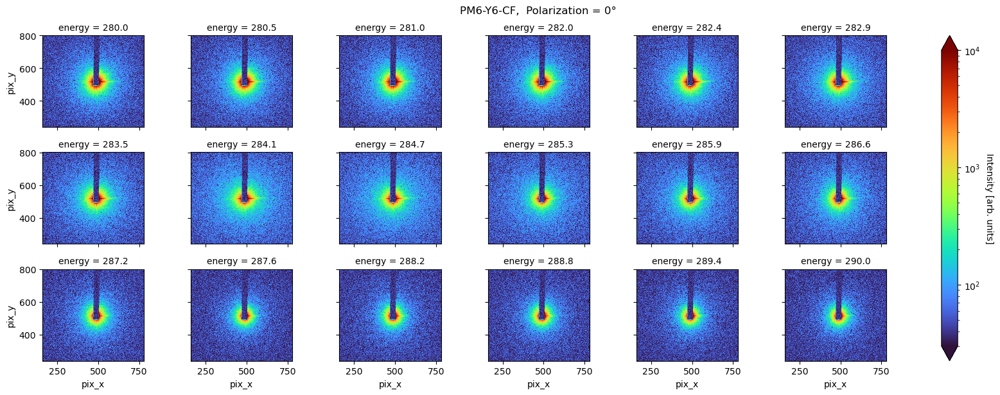

In [30]:
sample_DA = DS['raw_intensity'].sel(sample_name=sample_name)

# energies = [270, 280, 282, 283, 284, 285, 286, 290]
energies = np.round(np.linspace(280, 290, 18), 1)  # carbon
# energies = np.round(np.linspace(380, 440, 8), 1)  # nitrogen
# energies = np.round(np.linspace(510, 560, 8), 1)  # oxygen

pol = 0
# pol = 90

fg = sample_DA.sel(polarization=pol, method='nearest').sel(energy=energies, method='nearest').sel(
            pix_x=slice(160, 780), pix_y=slice(240, 800)).plot.imshow(figsize=(18, 6),
                col='energy', col_wrap=6, norm=LogNorm(3e1, 1e4), cmap=cmap)
fg.cbar.set_label('Intensity [arb. units]', rotation=270, labelpad=15)
fg.fig.suptitle(f'{str(sample_DA.sample_name.data)},  Polarization = {pol}°', y=1.02)
for axes in fg.axs.flatten():
    axes.set(aspect='equal')

plt.show()

In [ ]:
float(corr_sample_DA.compute().quantile(0.01))

In [ ]:
float(corr_sample_DA.compute().quantile(0.99))

In [80]:
DS['corr_intensity']

<xarray.DataArray 'corr_intensity' (sample_name: 2, polarization: 2,
                                    pix_y: 1024, pix_x: 1026, energy: 128)>
dask.array<mul, shape=(2, 2, 1024, 1026, 128), dtype=float64, chunksize=(1, 1, 1024, 1026, 1), chunktype=numpy.ndarray>
Coordinates:
    scan_id       (sample_name) int64 43187 43189
  * energy        (energy) float64 270.0 270.5 271.0 271.5 ... 335.0 340.0 345.0
    dark_id       (energy) float64 0.0 0.0 0.0 0.0 0.0 ... 5.0 5.0 5.0 5.0 5.0
  * pix_x         (pix_x) int64 0 1 2 3 4 5 6 ... 1020 1021 1022 1023 1024 1025
  * pix_y         (pix_y) int64 0 1 2 3 4 5 6 ... 1018 1019 1020 1021 1022 1023
  * polarization  (polarization) float64 0.0 90.0
    sample_id     (sample_name) <U7 'andrew3' 'andrew2'
  * sample_name   (sample_name) <U7 'andrew3' 'andrew2'

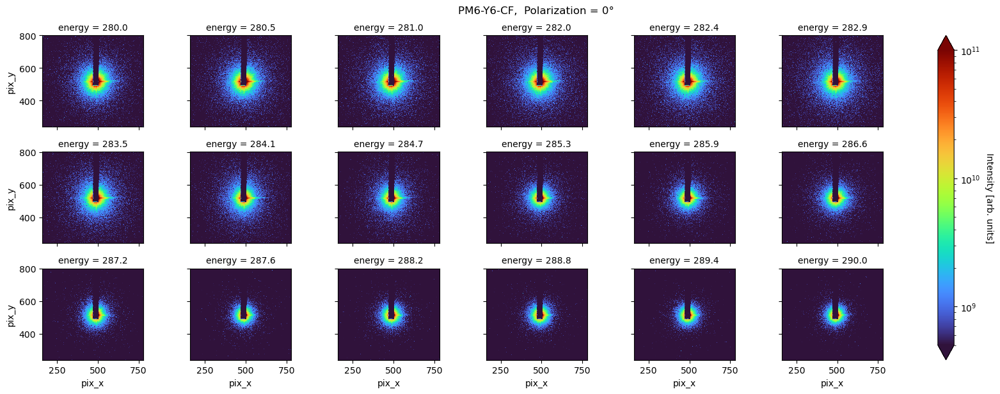

In [31]:
corr_sample_DA = DS['corr_intensity'].sel(sample_name=sample_name)

# energies = [270, 280, 282, 283, 284, 285, 286, 290]
energies = np.round(np.linspace(280, 290, 18), 1)  # carbon
# energies = np.round(np.linspace(380, 440, 8), 1)  # nitrogen
# energies = np.round(np.linspace(510, 550, 8), 1)  # oxygen

pol = 0

fg = corr_sample_DA.sel(polarization=90, method='nearest').sel(energy=energies, method='nearest').sel(
            pix_x=slice(160, 780), pix_y=slice(240, 800)).plot.imshow(figsize=(18, 6),
                col='energy', col_wrap=6, norm=LogNorm(5e8, 1e11), cmap=cmap)
fg.cbar.set_label('Intensity [arb. units]', rotation=270, labelpad=15)
fg.fig.suptitle(f'{str(sample_name)},  Polarization = {pol}°', y=1.02)
for axes in fg.axs.flatten():
    axes.set(aspect='equal')

plt.show()

### 2. Draw masks

In [ ]:
## WAXS mask:
waxs_mask_img = sample_DA.sel(polarization=0, energy=250, method='nearest').compute()
draw = phs.IntegrationUtils.DrawMask(waxs_mask_img, clim=(90, 1e2))
draw.ui()

In [ ]:
## Save and load saxs drawn mask
draw.save(maskPath.joinpath('WAXS_detector_180-and-90deg-SiN-mask.json'))

In [33]:
maskPath = userPath.joinpath('rsoxs_suite/masks')
len([f.name for f in maskPath.glob('*')])

31

### 3. Check beamcenters

  0%|          | 0/20 [00:00<?, ?it/s]

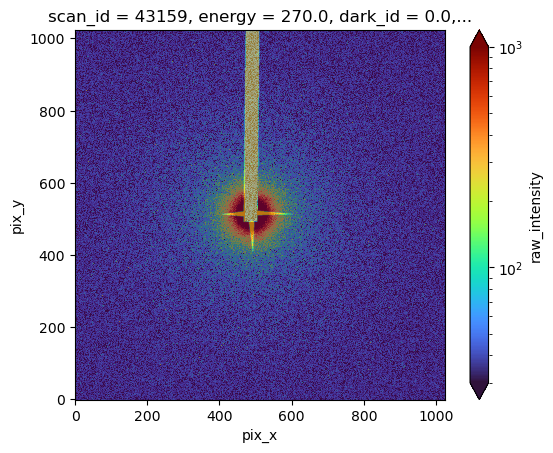

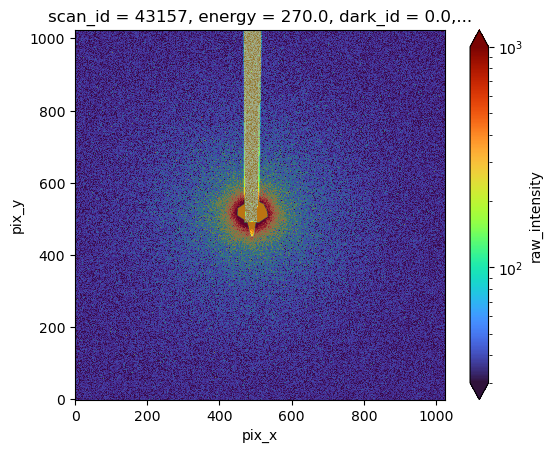

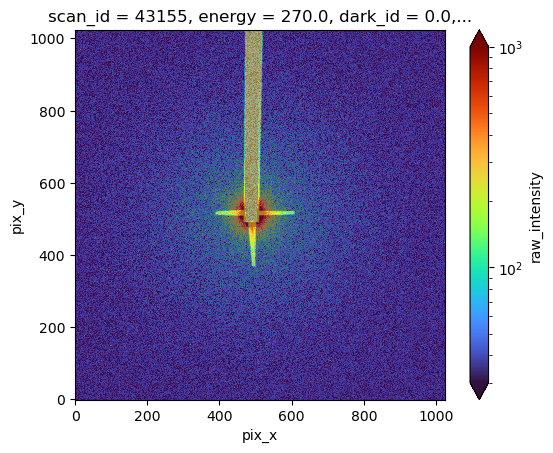

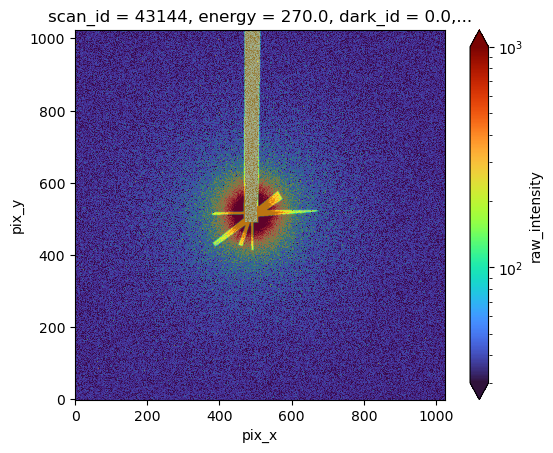

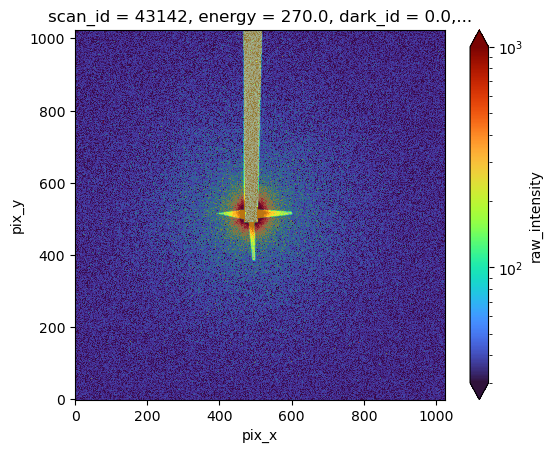

No mask for PM6-Y6-Tol


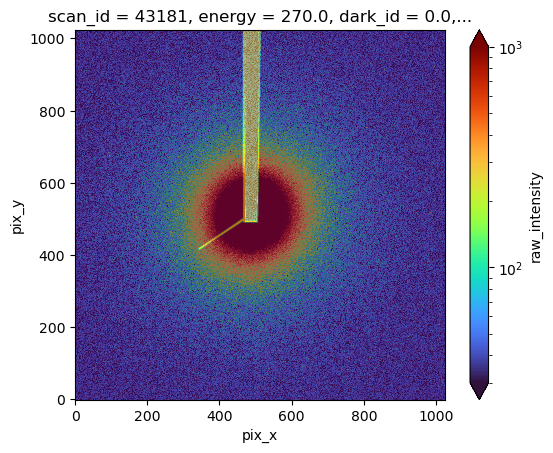

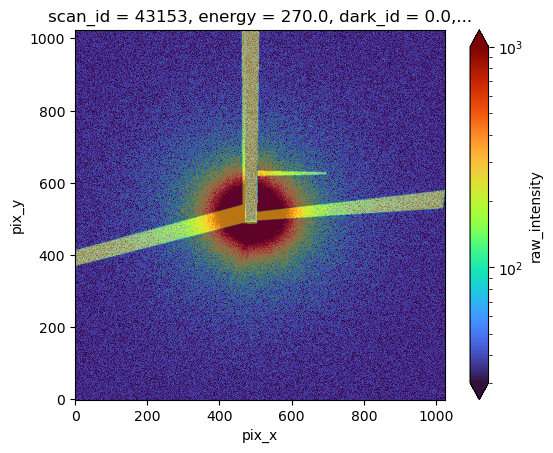

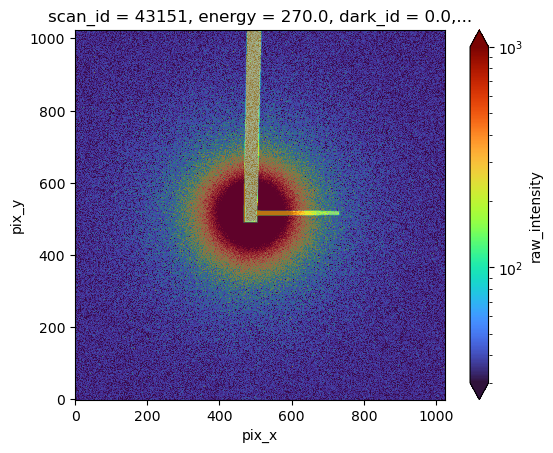

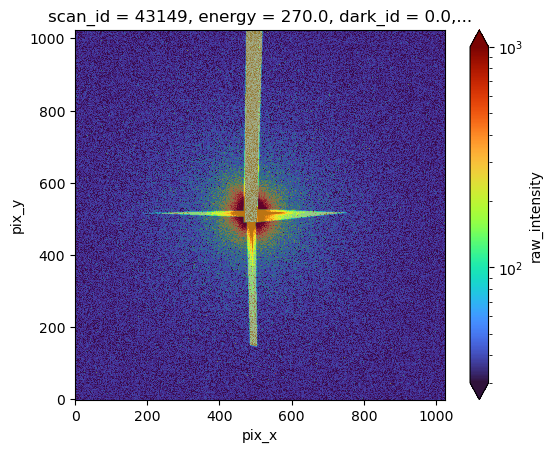

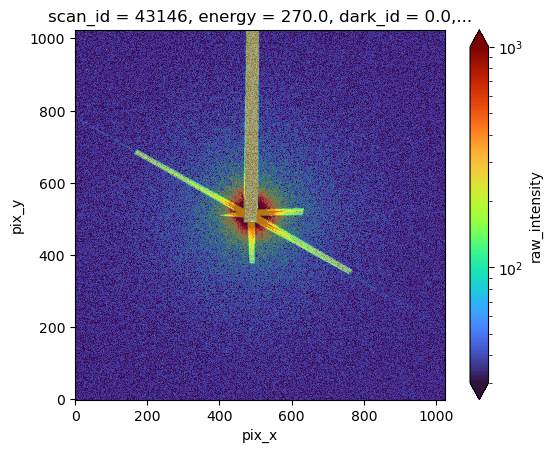

No mask for PM6-Y7BO-Tol
No mask for PM7D5-Y12-CF


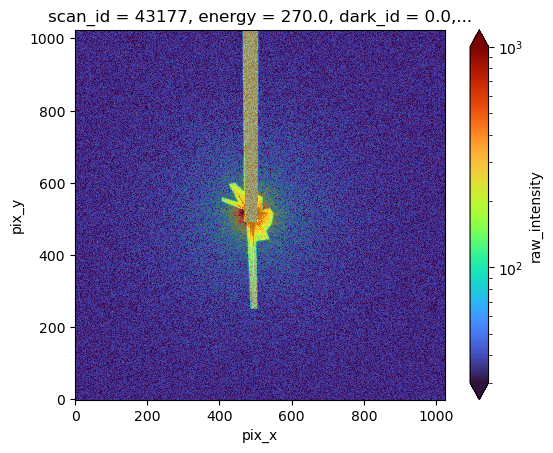

No mask for PM7D5-Y12-Tol


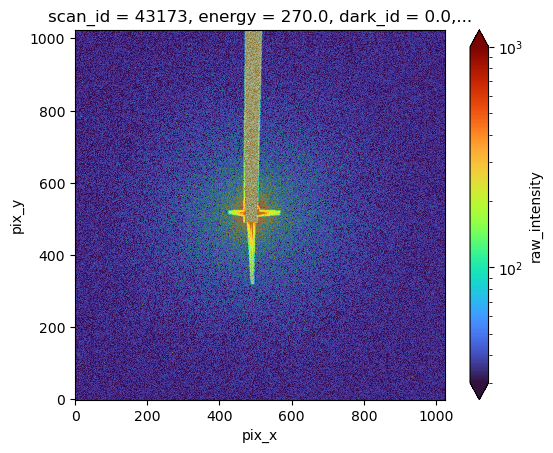

No mask for PM7D5-Y247-CF
No mask for PM7D5-Y247-Tol
No mask for PM7D5-Y6-CF


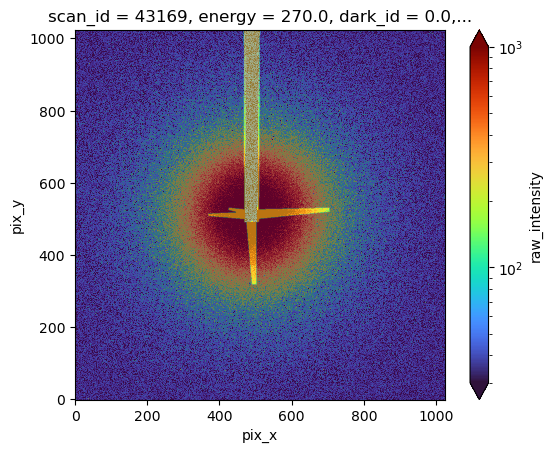

In [42]:
sample_name = 'PM6-Y6-CF'
for sample_name in tqdm(DS.sample_name.values):
    try:
        # Define example image for mask & initialize phs DrawMask object:
        sample_DA = DS['raw_intensity'].sel(sample_name=sample_name)
        energy = 250
        # energy = 400
        # energy = 532
        waxs_mask_img = sample_DA.sel(polarization=0, energy=energy, method='nearest').compute()
        draw = phs.IntegrationUtils.DrawMask(waxs_mask_img)

        # Load masks:
        draw.load(maskPath.joinpath(f'SAXS_{str(sample_DA.sample_id.data)}.json'))
        waxs_mask = draw.mask

        # Check masks:
        ax = waxs_mask_img.plot.imshow(norm=LogNorm(3e1, 1e3), cmap=cmap)
        ax.axes.imshow(waxs_mask, alpha=0.5, origin='lower')
        # ax.axes.imshow(WAXSinteg.mask, alpha=0.5, origin='lower')
        plt.show()
        plt.close('all')
    except FileNotFoundError:
        print(f'No mask for {sample_name}')

/nsls2/users/alevin/repos/PyHyperScattering/src/PyHyperScattering/PFGeneralIntegrator.py:323: UserWarning: Since mask was none, creating an empty mask with shape (1024, 1026)
  self.calibrationFromTemplateXRParams(template_xr)


WAXS Beamcenter: 
poni1: 0.030899999999999997, poni2: 0.029279999999999997 
ni_beamcenter_y: 515.0, ni_beamcenter_x: 488.0


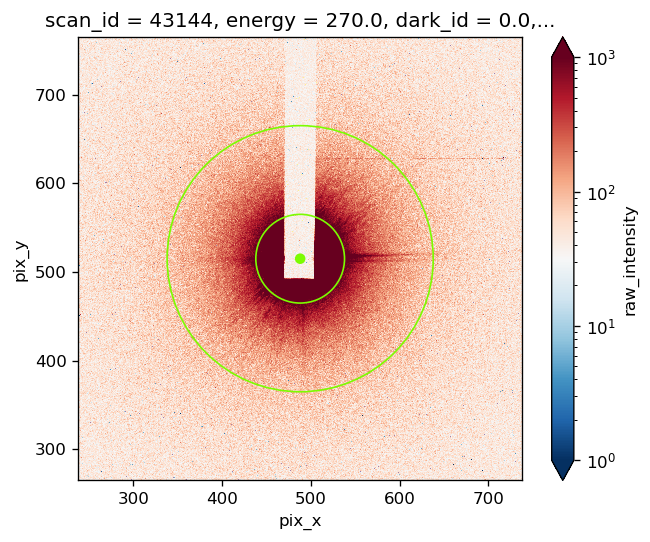

In [35]:
# Initalize PFEnergySeriesIntegrator object & check beamcenter & masks
# WAXS
WAXSinteg = phs.integrate.PFEnergySeriesIntegrator(geomethod='template_xr', template_xr=sample_DA.sel(polarization=0))
WAXSinteg.mask = waxs_mask
WAXSinteg.ni_beamcenter_x = waxs_mask_img.beamcenter_x
WAXSinteg.ni_beamcenter_y = waxs_mask_img.beamcenter_y
print('WAXS Beamcenter: \n'
      f'poni1: {WAXSinteg.poni1}, poni2: {WAXSinteg.poni2} \n'
      f'ni_beamcenter_y: {WAXSinteg.ni_beamcenter_y}, ni_beamcenter_x: {WAXSinteg.ni_beamcenter_x}')

# Plot check
phs.IntegrationUtils.Check.checkAll(WAXSinteg, waxs_mask_img, img_max=1e3, alpha=0.5)
plt.xlim(WAXSinteg.ni_beamcenter_x-250, WAXSinteg.ni_beamcenter_x+250)
plt.ylim(WAXSinteg.ni_beamcenter_y-250, WAXSinteg.ni_beamcenter_y+250)
plt.gcf().set(dpi=120)
plt.show()

In [ ]:
# ## Tweaking if needed:

# ## WAXS Tweaking & Plot Check
# waxs_new_bcx = 396.3
# waxs_new_bcy = 553
# WAXSinteg.ni_beamcenter_x = waxs_new_bcx
# WAXSinteg.ni_beamcenter_y = waxs_new_bcy
# raw_waxs.attrs['beamcenter_x'] = waxs_new_bcx
# raw_waxs.attrs['beamcenter_x'] = waxs_new_bcx
# raw_waxs.attrs['poni1'] = WAXSinteg.poni1
# raw_waxs.attrs['poni2'] = WAXSinteg.poni2

# print('WAXS Beamcenter Tweaking: \n'
#       f'poni1: {WAXSinteg.poni1}, poni2: {WAXSinteg.poni2} \n'
#       f'ni_beamcenter_y: {WAXSinteg.ni_beamcenter_y}, ni_beamcenter_x: {WAXSinteg.ni_beamcenter_x}')
# phs.IntegrationUtils.Check.checkAll(WAXSinteg, waxs_mask_img, img_max=5e3, alpha=0.6, guide1=40)
# plt.xlim(WAXSinteg.ni_beamcenter_x-200, WAXSinteg.ni_beamcenter_x+200)
# plt.ylim(WAXSinteg.ni_beamcenter_y-200, WAXSinteg.ni_beamcenter_y+200)
# plt.gcf().set(dpi=120)
# plt.show()


## Using Pete D.'s (very slightly modified) beamcentering script:
# phs.BeamCentering.CenteringAccessor.refine_geometry

# ## WAXS
# # res_waxs = raw_waxs.sel(pol=0).util.refine_geometry(energy=275, q_min=0.02, q_max=0.06, chi_min=-10, chi_max=70)
# res_waxs = sample_DA.sel(polarization=0).util.refine_geometry(energy=270, q_min=0.02, q_max=0.06)
# sample_DA.attrs['poni1'] = res_waxs.x[0]
# sample_DA.attrs['poni2'] = res_waxs.x[1]
# WAXSinteg = phs.integrate.PFEnergySeriesIntegrator(geomethod='template_xr', template_xr = sample_DA.sel(polarization=0))
# WAXSinteg.mask = waxs_mask

# ## WAXS Plot check
# print('WAXS Beamcenter Post-optimization: \n'
#       f'poni1: {WAXSinteg.poni1}, poni2: {WAXSinteg.poni2} \n'
#       f'ni_beamcenter_y: {WAXSinteg.ni_beamcenter_y}, ni_beamcenter_x: {WAXSinteg.ni_beamcenter_x}')
# phs.IntegrationUtils.Check.checkAll(WAXSinteg, waxs_mask_img, img_max=1e5, alpha=0.4)
# plt.xlim(WAXSinteg.ni_beamcenter_x-100, WAXSinteg.ni_beamcenter_x+100)
# plt.ylim(WAXSinteg.ni_beamcenter_y-100, WAXSinteg.ni_beamcenter_y+100)
# plt.gcf().set(dpi=120)
# plt.show()

In [ ]:
# ### Write beamcenters to saved .json file if content with them:

# beamcenters_dict = {
#     f'WAXS_2023C2': {'bcx':sample_DA.beamcenter_x, 'bcy':sample_DA.beamcenter_y}
# }

# # Check if the file exists, if not, create an empty JSON file
# jsonFile = jsonPath.joinpath('beamcenters_dict.json')
# if not jsonFile.exists():
#     with jsonFile.open('w') as f:
#         json.dump({}, f)

# # Now, read the existing or empty JSON file
# with jsonFile.open('r') as f:
#     dic = json.load(f)

# dic.update(beamcenters_dict)

# # Write the updated dictionary back to the JSON file
# with jsonFile.open('w') as f:
#     json.dump(dic, f)

In [207]:
# # Make mask DataArray:
# mask_DA = xr.DataArray(data=waxs_mask, dims=['pix_y', 'pix_x'])

# # Create Dataset of rsoxs_carbon and add the mask as a data variable
# DS = DA.to_dataset()
# DS['mask'] = mask_DA
# display(DS)

## Convert to chi-q space & save zarrs

In [43]:
# Integrate whole cartesian dataset!
polar_DS_sample_rows = []

# sample_names = DS.sample_name.data
# sample_names = sample_names[sample_names != ]

# for sample_id in tqdm(DS.sample_id.data):
for sample_name in tqdm(DS.sample_name.data):
# for sample_name in tqdm(['BareSiN', 'A3_3000_dSiN_01', 'BareAlO', 'PM6_3000_dSiN', 'PM6-Y7_3000_dSiN']):
    try:
        polar_DS = xr.Dataset()
        # for intensity in ['corr_intensity', 'sin_sub_corr_intensity']:

        sample_DA = DS['raw_intensity'].sel(sample_name=sample_name)
        energy = 250
        waxs_mask_img = sample_DA.sel(polarization=0, energy=energy, method='nearest').compute()
        draw = phs.IntegrationUtils.DrawMask(waxs_mask_img)
        draw.load(maskPath.joinpath(f'SAXS_{str(sample_DA.sample_id.data)}.json'))
        waxs_mask = draw.mask
        WAXSinteg.mask = waxs_mask    

        for intensity in ['corr_intensity']:
            polar_DA_polarization_rows = []
            for pol in [0, 90]:
                cart_DA = DS[intensity].sel(polarization=pol, sample_name=sample_name)

                sample_id = str(cart_DA.sample_id.values)

                polar_DA = WAXSinteg.integrateImageStack_dask(cart_DA)
                # polar_DA = WAXSinteg.integrateImageStack(cart_DA)
                polar_DA = polar_DA.expand_dims({'polarization': [pol]})
                polar_DA_polarization_rows.append(polar_DA)

            polar_DS[intensity] = xr.concat(polar_DA_polarization_rows, dim='polarization')

        polar_DS = polar_DS.expand_dims({'sample_name':[sample_name]})
        polar_DS = polar_DS.assign_coords({'sample_id': ('sample_name', [sample_id])})
        polar_DS_sample_rows.append(polar_DS)
        polar_DS.attrs['name'] = DS.name
    except FileNotFoundError:
        print(f'No mask for {sample_name}')    

    polar_DS = xr.concat(polar_DS_sample_rows, dim='sample_name')

  0%|          | 0/20 [00:00<?, ?it/s]

chunking on energy
chunking on energy
chunking on energy
chunking on energy
chunking on energy
chunking on energy
chunking on energy
chunking on energy
chunking on energy
chunking on energy
No mask for PM6-Y6-Tol
chunking on energy
chunking on energy
chunking on energy
chunking on energy
chunking on energy
chunking on energy
chunking on energy
chunking on energy
chunking on energy
chunking on energy
No mask for PM6-Y7BO-Tol
No mask for PM7D5-Y12-CF
chunking on energy
chunking on energy
No mask for PM7D5-Y12-Tol
chunking on energy
chunking on energy
No mask for PM7D5-Y247-CF
No mask for PM7D5-Y247-Tol
No mask for PM7D5-Y6-CF
chunking on energy
chunking on energy


In [56]:
polar_DS

<xarray.Dataset>
Dimensions:         (sample_name: 13, polarization: 2, chi: 360, q: 500,
                     energy: 128)
Coordinates:
  * sample_name     (sample_name) object 'PM6-Y12-CF' ... 'PM7D5-Y6-Tol'
  * polarization    (polarization) int64 0 90
  * chi             (chi) float64 -179.4 -178.4 -177.4 ... 177.4 178.4 179.4
  * q               (q) float64 2.575e-05 5.21e-05 7.845e-05 ... 0.01315 0.01318
  * energy          (energy) float64 270.0 270.5 271.0 ... 335.0 340.0 345.0
    sample_id       (sample_name) <U8 'andrew10' 'andrew11' ... 'andrew14'
Data variables:
    corr_intensity  (sample_name, polarization, energy, chi, q) float64 dask.array<chunksize=(1, 1, 5, 360, 500), meta=np.ndarray>
Attributes:
    name:     full_carbon_scan_nd-saxs

In [45]:
def make_para_perp_DAs(DS, sample_name, intensity_type, pol, qlims, chi_width):
    # select dataarray to plot
    DA = DS.sel(sample_name=sample_name)[f'{intensity_type}_intensity']
    sliced_DA = DA.sel(polarization=pol, q=slice(qlims[0],qlims[1]))

    # calculate ISI dataarrays
    if pol==0:
        para_DA = sliced_DA.rsoxs.slice_chi(180, chi_width=(chi_width/2))
        perp_DA = sliced_DA.rsoxs.slice_chi(90, chi_width=(chi_width/2))
    elif pol==90:
        perp_DA = sliced_DA.rsoxs.slice_chi(180, chi_width=(chi_width/2))
        para_DA = sliced_DA.rsoxs.slice_chi(90, chi_width=(chi_width/2))   
        
    return para_DA, perp_DA

In [51]:
polar_DS.q.min()

<xarray.DataArray 'q' ()>
array(2.57486879e-05)

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

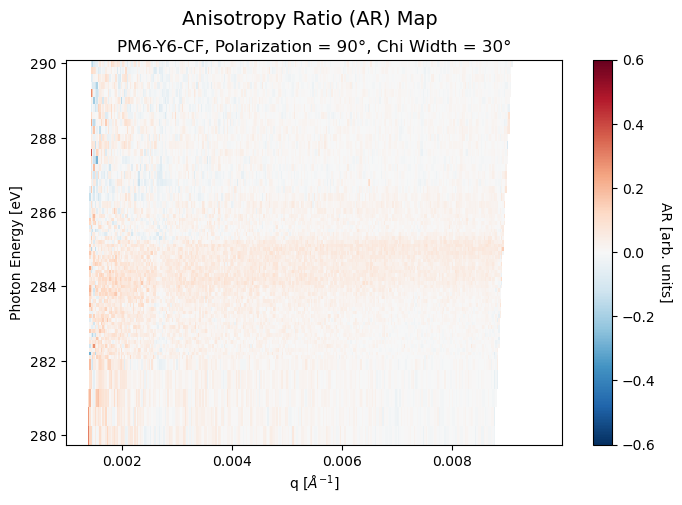

In [47]:
# make selection
sample_name = 'PM6-Y6-CF'
edge = 'carbon'
intensity_type = 'corr'
pol = 90
qlims = (0.001, 0.01)
chi_width = 30
energy_min = 280
energy_max = 290

para_DA, perp_DA = make_para_perp_DAs(polar_DS, sample_name, intensity_type, pol, qlims, chi_width)   

# Select AR data
ar_DA = (para_DA.mean('chi') - perp_DA.mean('chi')) / (para_DA.mean('chi') + perp_DA.mean('chi'))

# Plot
ax = ar_DA.sel(energy=slice(energy_min,energy_max)).plot(figsize=(8,5), norm=plt.Normalize(-0.6,0.6))
ax.figure.suptitle('Anisotropy Ratio (AR) Map', fontsize=14, x=0.43)
ax.axes.set(title=f'{sample_name}, Polarization = {pol}°, Chi Width = {chi_width}°', ylabel='Photon Energy [eV]', xlabel='q [$Å^{-1}$]')
ax.colorbar.set_label('AR [arb. units]', rotation=270, labelpad=12)
plt.show()

In [ ]:
display(polar_DS.sample_name.values)
sample_name = 'PM6-Y6_3000_dSiN'

In [ ]:
# energy = 285
# energy = 400
energy = 530

polar_DS['corr_intensity'].sel(sample_name=sample_name, polarization=0, q=slice(0,0.05)).sel(
    energy=energy, method='nearest').plot.imshow(norm=LogNorm(1e8, 1e9), cmap=cmap)

In [ ]:
# 1. Get energy values
energy_values = polar_DS.energy.values
energy_slices = [energy_values[i:i+5] for i in range(0, len(energy_values), 5)]
energy_slices

In [247]:
polar_DS

<xarray.Dataset>
Dimensions:         (sample_name: 19, polarization: 2, chi: 360, q: 500,
                     energy: 128)
Coordinates:
  * sample_name     (sample_name) object 'PM6-Y12-CF' ... 'PM7D5-Y6-Tol'
  * polarization    (polarization) int64 0 90
  * chi             (chi) float64 -179.4 -178.4 -177.4 ... 177.4 178.4 179.4
  * q               (q) float64 0.0002513 0.0005086 0.0007659 ... 0.1284 0.1286
  * energy          (energy) float64 270.0 270.5 271.0 ... 335.0 340.0 345.0
    sample_id       (sample_name) <U8 'andrew10' 'andrew11' ... 'andrew14'
Data variables:
    corr_intensity  (sample_name, polarization, energy, chi, q) float64 dask.array<chunksize=(1, 1, 5, 360, 500), meta=np.ndarray>
Attributes:
    name:     full_carbon_scan_nd-waxs

In [253]:
polar_DS

<xarray.Dataset>
Dimensions:         (sample_name: 19, polarization: 2, chi: 360, q: 500,
                     energy: 128)
Coordinates:
  * sample_name     (sample_name) object 'PM6-Y12-CF' ... 'PM7D5-Y6-Tol'
  * polarization    (polarization) int64 0 90
  * chi             (chi) float64 -179.4 -178.4 -177.4 ... 177.4 178.4 179.4
  * q               (q) float64 0.0002513 0.0005086 0.0007659 ... 0.1284 0.1286
  * energy          (energy) float64 270.0 270.5 271.0 ... 335.0 340.0 345.0
    sample_id       (sample_name) <U8 'andrew10' 'andrew11' ... 'andrew14'
Data variables:
    corr_intensity  (sample_name, polarization, energy, chi, q) float64 dask.array<chunksize=(1, 1, 5, 360, 500), meta=np.ndarray>
Attributes:
    name:     full_carbon_scan_nd-waxs

In [257]:
xr.Dataset.to_zarr??

Signature:
xr.Dataset.to_zarr(
    self,
    store: 'MutableMapping | str | PathLike[str] | None' = None,
    chunk_store: 'MutableMapping | str | PathLike | None' = None,
    mode: "Literal['w', 'w-', 'a', 'r+', None]" = None,
    synchronizer=None,
    group: 'str | None' = None,
    encoding: 'Mapping | None' = None,
    compute: 'bool' = True,
    consolidated: 'bool | None' = None,
    append_dim: 'Hashable | None' = None,
    region: 'Mapping[str, slice] | None' = None,
    safe_chunks: 'bool' = True,
    storage_options: 'dict[str, str] | None' = None,
    zarr_version: 'int | None' = None,
    chunkmanager_store_kwargs: 'dict[str, Any] | None' = None,
) -> 'ZarrStore | Delayed'
Source:   
    def to_zarr(
        self,
        store: MutableMapping | str | PathLike[str] | None = None,
        chunk_store: MutableMapping | str | PathLike | None = None,
        mode: Literal["w", "w-", "a", "r+", None] = None,
        synchronizer=None,
        group: str | None = None,
        e

In [256]:

sample_names = ['PM6-Y12-CF', 'PM6-Y12-CFCN', 'PM6-Y12-Tol', 'PM6-Y6-CFCN', 'PM6-Y6-Tol', 'PM6-Y7-Tol', 'PM6-Y7BO-CFCN', 'PM7D5-Y12-Tol_2', 'PM7D5-Y6-CF']

for sample_name in tqdm(sample_names[1:], desc='Samples...'):
    polar_DS.sel(sample_name=[sample_name]).to_zarr(zarrsPath.joinpath(f'polar_{polar_DS.name}.zarr'), mode='a', append_dim='sample_name')

Samples...:   0%|          | 0/8 [00:00<?, ?it/s]

ValueError: cannot set append_dim unless mode='a' or mode=None

In [260]:
polar_DS = polar_DS.compute()

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:02<?, ?it/s]

  0%|          | 0/3 [00:03<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

In [59]:
polar_DS

<xarray.Dataset>
Dimensions:         (sample_name: 13, polarization: 2, chi: 360, q: 500,
                     energy: 128)
Coordinates:
  * sample_name     (sample_name) object 'PM6-Y12-CF' ... 'PM7D5-Y6-Tol'
  * polarization    (polarization) int64 0 90
  * chi             (chi) float64 -179.4 -178.4 -177.4 ... 177.4 178.4 179.4
  * q               (q) float64 2.575e-05 5.21e-05 7.845e-05 ... 0.01315 0.01318
  * energy          (energy) float64 270.0 270.5 271.0 ... 335.0 340.0 345.0
    sample_id       (sample_name) <U8 'andrew10' 'andrew11' ... 'andrew14'
Data variables:
    corr_intensity  (sample_name, polarization, energy, chi, q) float64 dask.array<chunksize=(1, 1, 5, 360, 500), meta=np.ndarray>
Attributes:
    name:     full_carbon_scan_nd-saxs

In [60]:
polar_DS = polar_DS.compute()

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

In [62]:
sample_names = polar_DS.sample_name.values



polar_DS.sel(sample_name=[sample_names[0]]).to_zarr(zarrsPath.joinpath(f'polar_{polar_DS.name}.zarr'), mode='w')

for sample_name in tqdm(sample_names[1:], desc='Samples...'):
    polar_DS.sel(sample_name=[sample_name]).to_zarr(zarrsPath.joinpath(f'polar_{polar_DS.name}.zarr'), mode='a', append_dim='sample_name')

Samples...:   0%|          | 0/12 [00:00<?, ?it/s]

In [ ]:
# # import zarr

# # sample_names = polar_DS.sample_name.values
# # energy_values = polar_DS.energy.values
# # energy_slices = [energy_values[i:i+5] for i in range(0, len(energy_values), 5)]

# # root_store = zarr.open_group(zarrsPath.joinpath(f'polar_{polar_DS.name}_regions.zarr').as_posix(), mode='a')

# # for sample in sample_names:
# #     # Make sure there's a group for this sample in the Zarr store
# #     if sample not in root_store.group_keys():
# #         root_store.create_group(sample)
    
# #     subset_by_sample = polar_DS.sel(sample_name=sample)
    
# #     for idx, energy_slice in enumerate(energy_slices):
# #         final_subset = subset_by_sample.sel(energy=energy_slice)
        
# #         # Save to the specific group and energy slice within the Zarr store
# #         final_subset.to_zarr(root_store[sample], mode='a', append_dim='energy', consolidated=True)

# sample_names = polar_DS.sample_name.values
# energy_values = polar_DS.energy.values
# energy_slices = [energy_values[i:i+5] for i in range(0, len(energy_values), 5)]

# main_zarr_path = zarrsPath.joinpath(f'polar_{polar_DS.name}_regions.zarr')

# for sample in tqdm(sample_names, desc='Samples...'):
#     subset_by_sample = polar_DS.sel(sample_name=sample)
    
#     # Define path for the sample within the main Zarr store
#     sample_path = main_zarr_path.joinpath(sample)
    
#     for idx, energy_slice in enumerate(energy_slices):
#         final_subset = subset_by_sample.sel(energy=energy_slice)
        
#         # Save to the specific sample path and energy slice within the Zarr store
#         if idx==0:
#             final_subset.to_zarr(sample_path, mode='w', consolidated=True)
#         else:
#             final_subset.to_zarr(sample_path, mode='a', append_dim='energy', consolidated=True)



In [ ]:
def make_para_perp_DAs(datasets, sample_name, edge, intensity_type, pol, qlims, chi_width):
    # select dataarray to plot
    DS = datasets[f'polar_{edge}']
    DA = DS.sel(sample_name=sample_name)[f'{intensity_type}_intensity']
    sliced_DA = DA.sel(polarization=pol, q=slice(qlims[0],qlims[1]))

    # calculate ISI dataarrays
    if pol==0:
        para_DA = sliced_DA.rsoxs.slice_chi(180, chi_width=(chi_width/2))
        perp_DA = sliced_DA.rsoxs.slice_chi(90, chi_width=(chi_width/2))
    elif pol==90:
        perp_DA = sliced_DA.rsoxs.slice_chi(180, chi_width=(chi_width/2))
        para_DA = sliced_DA.rsoxs.slice_chi(90, chi_width=(chi_width/2))   
        
    return para_DA, perp_DA

# load dictionary of rsoxs datasets
rsoxs_datasets = {}
key = 'polar_regions'
key_start = key.split('_')[0]
key_end = key.split('_')[1]        
zarrPath = list(zarrsPath.glob(f'{key_start}*{key_end}.zarr'))[0]
rsoxs_datasets[key] = xr.open_zarr(zarrPath)

# Compute any dask coordiantes
for coord_name, coord_data in rsoxs_datasets[key].coords.items():
    if isinstance(coord_data.data, da.Array):
        rsoxs_datasets[key].coords[coord_name] = coord_data.compute()
            
rsoxs_datasets[key]

In [ ]:
# make selection
edge = 'regions'
intensity_type = 'corr'
qlims = (0.01, 0.08)
chi_width = 30

for sample_name in tqdm(rsoxs_datasets[f'polar_{edge}'].sample_name.data):
    for pol in [0, 90]:
        ### Select para & perp DataArrays
        para_DA, perp_DA = make_para_perp_DAs(rsoxs_datasets, sample_name, edge, intensity_type, pol, qlims, chi_width)  
        
#         ### ISI:
#         # Slice ISI data
#         para_ISI = para_DA.interpolate_na(dim='q').mean('chi').sum('q')
#         perp_ISI = perp_DA.interpolate_na(dim='q').mean('chi').sum('q')

#         # Plot
#         fig, ax = plt.subplots()
#         para_ISI.sel(energy=slice(280,290)).plot.line(ax=ax, label='para', yscale='log')
#         perp_ISI.sel(energy=slice(280,290)).plot.line(ax=ax, label='perp', yscale='log')
#         fig.suptitle('Integrated Scattering Intensity (ISI)', fontsize=14)
#         ax.set(title=f'{sample_name}, Polarization = {pol}°, Chi Width = {chi_width}°', xlabel='Photon Energy [eV]', ylabel='Double-Norm-Corrected Intensity [arb. units]')
#         ax.legend()
#         fig.savefig(plotsPath.joinpath('isi', f'{sample_name}_{edge}_{intensity_type}_chiWidth-{chi_width}deg_pol{pol}deg.png'), dpi=120)
#         plt.close('all')
        
#         ### Linecut Maps:
#         fig, axs = plt.subplots(1, 2, figsize=(11,5))

#         para_DA.mean('chi').sel(energy=slice(282,290)).plot(ax=axs[0], cmap=cmap, norm=LogNorm(1e9, 1e11), add_colorbar=False)
#         perp_DA.mean('chi').sel(energy=slice(282,290)).plot(ax=axs[1], cmap=cmap, norm=LogNorm(1e9, 1e11), add_colorbar=False)

#         sm = plt.cm.ScalarMappable(cmap=cmap, norm=LogNorm(2e10, 1e12)) # Create a ScalarMappable object with the colormap and normalization & add the colorbar to the figure
#         cax = axs[1].inset_axes([1.03, 0, 0.05, 1])
#         cbar = fig.colorbar(sm, cax=cax, orientation='vertical')
#         cbar.set_label(label='Intensity [arb. units]', labelpad=12)
#         fig.suptitle(f'Linecut Maps: {sample_name}, Polarization = {pol}°, Chi Width = {chi_width}°', fontsize=14)
#         fig.set(tight_layout=True)
#         axs[0].set(title='Parallel to $E_p$', ylabel='Photon energy [eV]', xlabel='q [$Å^{-1}$]')
#         axs[1].set(title='Perpendicular to $E_p$ ', ylabel=None, xlabel='q [$Å^{-1}$]')
#         fig.savefig(plotsPath.joinpath('linecut_maps', f'{sample_name}_{edge}_{intensity_type}_chiWidth-{chi_width}deg_pol{pol}deg.png'), dpi=120)
#         plt.close('all')

        ### AR Maps:
        # Select AR data
        ar_DA = (para_DA.mean('chi') - perp_DA.mean('chi')) / (para_DA.mean('chi') + perp_DA.mean('chi'))

        # Plot
        ax = ar_DA.sel(energy=slice(282,292)).plot(figsize=(8,5), norm=plt.Normalize(-0.6, 0.6))
        ax.figure.suptitle('Anisotropy Ratio (AR) Map', fontsize=14, x=0.43)
        ax.axes.set(title=f'{sample_name}, Polarization = {pol}°, Chi Width = {chi_width}°', ylabel='Photon Energy [eV]', xlabel='q [$Å^{-1}$]')
        ax.colorbar.set_label('AR [arb. units]', rotation=270, labelpad=12)
        # ax.figure.savefig(plotsPath.joinpath('ar_maps', f'{sample_name}_{edge}_{intensity_type}_chiWidth-{chi_width}deg_pol{pol}deg.png'), dpi=120)
        plt.show()
        plt.close('all')